# CS441 – Generative Artificial Intelligence Laboratory
# Practice Notebook: Exploring the Hugging Face Ecosystem

This practice notebook introduces the Hugging Face ecosystem through guided exploration and executable examples.

**Name:** Aditya Arya
-----
**Roll No.:** 23CS3068
-----
**Branch:** Computer Science and Engineering
-----

**GenAI Lab 1 Assignment**
-----

## Learning Objectives

- Explore Hugging Face Model Hub
- Load pretrained diffusion models
- Perform prompt engineering experiments
- Understand Model Cards
- Inspect repositories using `huggingface_hub`
- Use pretrained pipelines
- Perform inference with pretrained models


## Explore the Hugging Face Ecosystem

Visit:
- https://huggingface.co/
- https://huggingface.co/models
- https://huggingface.co/datasets
- https://huggingface.co/spaces

Observe:
- Trending models
- Tasks
- Downloads
- Licenses
- Model cards
- Community discussions


## 1. Install Required Libraries

In [1]:
!pip -q install diffusers transformers accelerate safetensors torch

## 2. Import Libraries

In [2]:
import torch
from diffusers import StableDiffusionPipeline

device='cuda' if torch.cuda.is_available() else 'cpu'
print(device)


Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


cuda


## 3. Load Stable Diffusion

In [3]:
pipe=StableDiffusionPipeline.from_pretrained(
'runwayml/stable-diffusion-v1-5',
torch_dtype=torch.float16 if device=='cuda' else torch.float32)

pipe=pipe.to(device)


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

# **Task 1: Prompt Engineering for Text-to-Image Generation**

Objective:
Generate images using two different prompts and evaluate how prompt refinement
affects semantic alignment and visual quality.

Generate First Image

  0%|          | 0/50 [00:00<?, ?it/s]

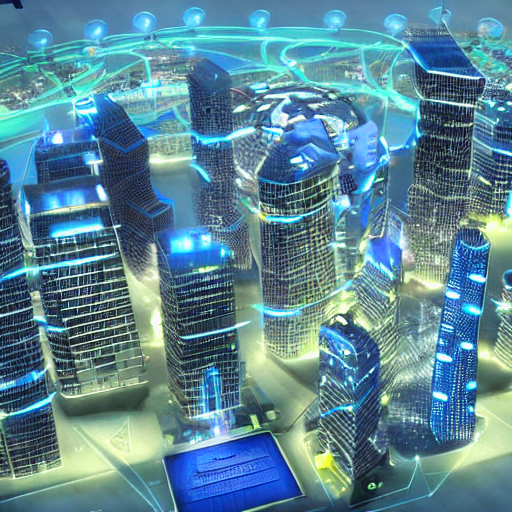

In [4]:
prompt='A futuristic smart city'
image=pipe(prompt).images[0]
image

### Prompt Engineering Exploration for Text-to-Image Generation

Modify one attribute at a time:
- Style
- Lighting
- Camera
- Resolution
- Weather
- Background
- Art medium

Observe the effect of each modification.


  0%|          | 0/50 [00:00<?, ?it/s]

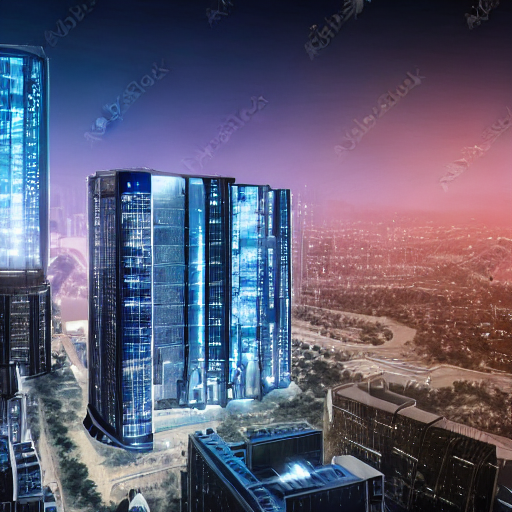

In [5]:
prompt = (
    "A futuristic smart city with autonomous vehicles, "
    "glass skyscrapers, cinematic lighting, ultra realistic, "
    "8K, DSLR photography"
)
image=pipe(prompt).images[0]
image


### Comparative Evaluation

| Aspect | Prompt 1 | Prompt 2 |
|--------|----------|----------|
| Semantic Alignment | Generic futuristic city | Better representation of a smart city |
| Visual Detail | Moderate | High |
| Lighting | Basic | Cinematic |
| Realism | Moderate | Highly realistic |
| Overall Quality | Good | Excellent |

  0%|          | 0/50 [00:00<?, ?it/s]

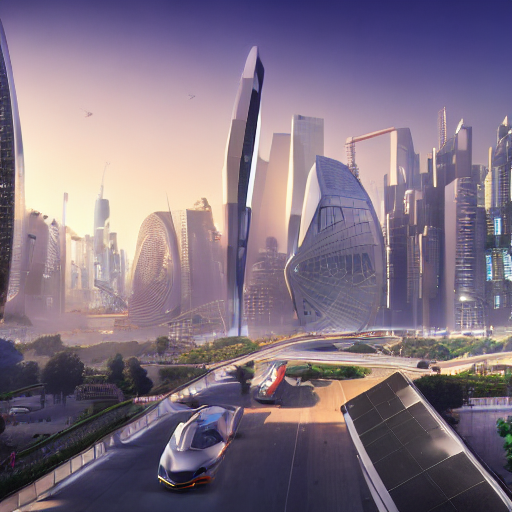

In [6]:
prompt = (
    "A futuristic sustainable smart city with autonomous electric vehicles, flying drones, intelligent traffic control, glass skyscrapers with green rooftops, solar panels, smart street lighting, people walking, water bodies, cinematic golden hour lighting, ultra realistic, highly detailed, photorealistic, HDR, 8K, DSLR photography, volumetric lighting, award-winning architectural visualization"
)
image=pipe(prompt).images[0]
image

## **Task 1: Suggested Improved Prompt**

"A futuristic sustainable smart city with autonomous electric vehicles, flying drones, intelligent traffic control, glass skyscrapers with green rooftops, solar panels, smart street lighting, people walking, water bodies, cinematic golden hour lighting, ultra realistic, highly detailed, photorealistic, HDR, 8K, DSLR photography, volumetric lighting, award-winning architectural visualization"

### **Justification**

The improved prompt introduces sustainability features, AI-enabled
infrastructure, and advanced rendering descriptors. These additions provide
richer semantic guidance, resulting in images with improved realism and
closer alignment to the intended concept.

# **---TASK 1 COMPLETED---**

## TODO: Explore Other Models

Replace the checkpoint with models such as:
- stabilityai/stable-diffusion-2-1
- stabilityai/sdxl-turbo

Compare:
- Generation speed
- Prompt adherence
- Visual quality


## Reflection
1. Why are pretrained models useful?
2. How does prompt engineering influence output quality?


## Explore the Hugging Face Hub

- Model Card
- Hugging Face Spaces
- Repository Files

In [7]:
!pip -q install transformers datasets huggingface_hub

## 1.Explore a Hugging Face Model Card

Every model repository contains a **Model Card** (`README.md`) describing the model. Investigate the model page on Hugging Face and identify:

- Model name
- Developer/Organization
- Task
- License
- Intended use
- Limitations
- Hardware recommendations
- Citation

**Suggested Model:** `distilgpt2` or any model used in this notebook.

In [8]:
from huggingface_hub import model_info

info = model_info("distilgpt2")
print("Model:", info.id)
print("Downloads:", info.downloads)
print("Likes:", info.likes)
print("Library:", info.library_name)
print("Pipeline Tag:", info.pipeline_tag)
print("Tags:", info.tags[:10])
print("License:", info.cardData.get("license") if info.cardData else "N/A")


Model: distilbert/distilgpt2
Downloads: 2560742
Likes: 637
Library: transformers
Pipeline Tag: text-generation
Tags: ['transformers', 'pytorch', 'tf', 'jax', 'tflite', 'rust', 'coreml', 'safetensors', 'gpt2', 'text-generation']
License: apache-2.0


## 2.Inspect Repository Files

A typical Hugging Face model repository contains configuration and weight files. Identify the purpose of the following files:

- README.md (Model Card)
- config.json
- tokenizer.json
- tokenizer_config.json
- generation_config.json
- model.safetensors


In [9]:
from huggingface_hub import list_repo_files

files = list_repo_files("distilgpt2")
for f in files:
    print(f)


.gitattributes
64.tflite
README.md
config.json
coreml/text-generation/float32_model.mlpackage/Data/com.apple.CoreML/model.mlmodel
coreml/text-generation/float32_model.mlpackage/Data/com.apple.CoreML/weights/weight.bin
coreml/text-generation/float32_model.mlpackage/Manifest.json
coreml_model.mlmodel
flax_model.msgpack
generation_config.json
generation_config_for_text_generation.json
merges.txt
model.safetensors
pytorch_model.bin
rust_model.ot
tf_model.h5
tokenizer.json
tokenizer_config.json
vocab.json


## 3.Exploring Hugging Face Spaces
Spaces host interactive AI applications built with Gradio, Streamlit, Docker or Static HTML.

In [10]:
from huggingface_hub import list_spaces

spaces = list_spaces(limit=10)
for s in spaces:
    print(s.id)


cinderholm/wan2-2-i2v-v3
prithivMLmods/Qwen-Image-Edit-2511-LoRAs-Fast
obsxrver/wan22-i2v-omni-lora
multimodalart/minimax-h3
kulkas2pintu/wan555
cruisewagner2220/Qwen-Image-Edit-Rapid-AIO-Loras-Experimental-neo
victor/DeepSeek-V4-Flash-0731-free-endpoint
selfit-camera/Omni-Image-Editor
Alissonerdx/charactersheet-lora-demo
Fighterdan/LTX-2.3-10Eros_I2V


## 4. Access an Hugging Face Space with Api


Create an API Object

In [11]:
from huggingface_hub import HfApi
api = HfApi()
print("Hugging Face API Ready")

Hugging Face API Ready


Programmatically listing Popular Spaces

In [12]:
spaces = api.list_spaces(search='chatbot',limit=10)
print("Search Results:")
for s in spaces:
    print(s.id)

Search Results:
joonion/pdf-rag-chatbot
trong333tn/chatbotai_rag
lmarena-ai/chatbot-arena
awacke1/lmsys-chatbot-arena-leaderboard
abdullahtahir/My_Chatbot
shrinusn77/kimi-k2.6-chatbot
parmeshlata/Portfolio-Chatbot
yasmincinar/ysmn-cnr-eco-chatbot
anshu8077/Chatbot
HateezAbullah/dawn-news-rag-chatbot


Explore Space Information

- Replace the Space ID with any public Space.

In [13]:
space_id='gradio/calculator'
info=api.space_info(space_id)
print("Space:",info.id)
print("SDK:",info.sdk)
print("Likes:",info.likes)
print("Private:",info.private)

Space: gradio/calculator
SDK: gradio
Likes: 2
Private: False


List Files Available in a Space

In [14]:
files = api.list_repo_files(space_id, repo_type='space')
print("Repository Files:")
for f in files:
    print(f)

Repository Files:
.gitattributes
README.md
__pycache__/run.cpython-36.pyc
__pycache__/run.cpython-38.pyc
examples/log.csv
run.ipynb
run.py
screenshot.gif


Explore Another Space

In [15]:
space_id = "hysts/SDXL"

info = api.space_info(space_id)

print("Space Name :", info.id)
print("SDK        :", info.sdk)
print("Likes      :", info.likes)

Space Name : hysts/SDXL
SDK        : gradio
Likes      : 389


Search for Spaces

In [16]:
spaces = api.list_spaces(search="chatbot", limit=10)

for space in spaces:
    print(space.id)

joonion/pdf-rag-chatbot
trong333tn/chatbotai_rag
lmarena-ai/chatbot-arena
awacke1/lmsys-chatbot-arena-leaderboard
abdullahtahir/My_Chatbot
shrinusn77/kimi-k2.6-chatbot
parmeshlata/Portfolio-Chatbot
yasmincinar/ysmn-cnr-eco-chatbot
anshu8077/Chatbot
HateezAbullah/dawn-news-rag-chatbot


Search by Keyword

In [17]:
keyword = "image"

spaces = api.list_spaces(search=keyword, limit=15)

for i, space in enumerate(spaces, start=1):
    print(f"{i}. {space.id}")

1. prithivMLmods/Qwen-Image-Edit-2511-LoRAs-Fast
2. cruisewagner2220/Qwen-Image-Edit-Rapid-AIO-Loras-Experimental-neo
3. selfit-camera/Omni-Image-Editor
4. mrfakename/Z-Image-Turbo
5. prithivMLmods/FireRed-Image-Edit-1.0-Fast
6. Onise/Qwen-Image-Edit-2509-LoRAs-Fast2
7. LPX55/Qwen-Image-Edit-2511-Turbo-Lightning
8. multimodalart/qwen-image-multiple-angles-3d-camera
9. prithivMLmods/Qwen-Image-Edit-2509-LoRAs-Fast
10. Qwen/Qwen-Image-Edit-2511
11. linoyts/Qwen-Image-Edit-Angles
12. Tongyi-MAI/Z-Image-Turbo
13. linoyts/Qwen-Image-Edit-2511-Fast
14. Memfice/Qwen-Image-Edit-next-scene
15. bleckhert/uncensored-image-to-video-alchemist


Open a Space in Your Browser

In [18]:
import webbrowser

space = "gradio/calculator"
url = f"https://huggingface.co/spaces/{space}"
print(url)

webbrowser.open(url)

https://huggingface.co/spaces/gradio/calculator


False

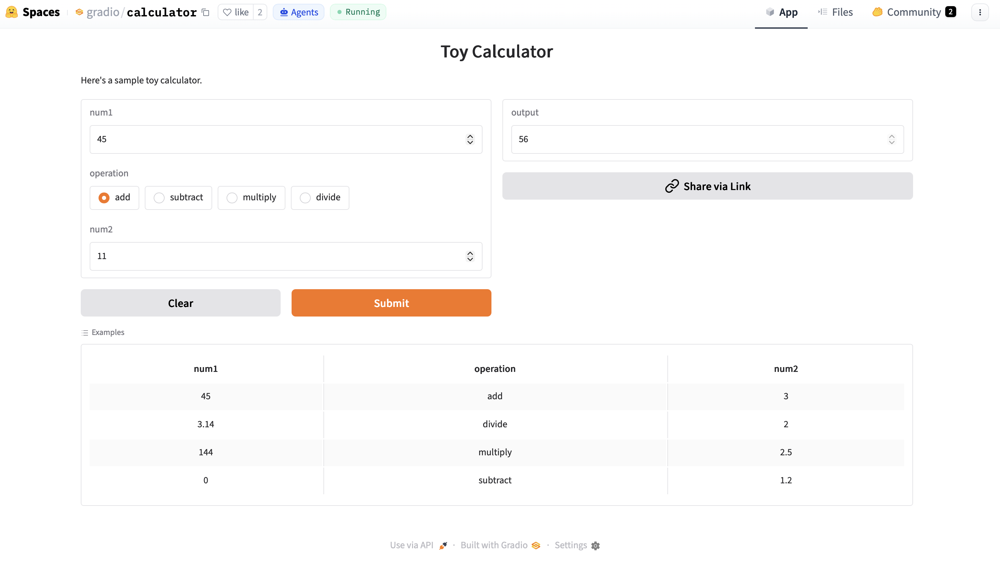

Discover popular models in the Hugging Face ecosystem

In [19]:
from huggingface_hub import HfApi
api = HfApi()
# Official task filtering
models = api.list_models(pipeline_tag="text-generation", sort="downloads", limit=10)

for i, model in enumerate(models, start=1):
    print(f"{i}. {model.id}")



1. Qwen/Qwen3-0.6B
2. facebook/opt-125m
3. Qwen/Qwen3-8B
4. trl-internal-testing/tiny-Qwen2ForCausalLM-2.5
5. Qwen/Qwen2.5-1.5B-Instruct
6. openai-community/gpt2
7. Qwen/Qwen2.5-7B-Instruct
8. nvidia/Qwen3.6-35B-A3B-NVFP4
9. meta-llama/Llama-3.2-1B-Instruct
10. deepseek-ai/DeepSeek-R1




Visit https://huggingface.co/spaces and identify three Spaces.

Record:
- Space name
- Task
- Framework (Gradio/Streamlit)
- Underlying model (if mentioned)
- Your observations

## TODO:

Browse the Model Hub and identify 5 trending models across different tasks (text generation, vision, speech, multimodal). Discuss why these models may be popular.



Reflection
- Why are pretrained models useful?
- What information in a Model Card is most useful before deployment?
- What is a Hugging Face Space?
- Which SDK (Gradio, Streamlit, Static HTML, Docker) is used by the selected Space?
- Why should engineers check model licenses?
- What is the purpose of the README.md file?
- What is the purpose of app.py?
- How Spaces complement Models and Datasets
- Why are Hugging Face Spaces useful for deploying AI models?

# **TASK 2: Hugging Face**

| Hugging Face Component | Purpose                                                                                                                         | Practical Use Case                                                                                                                        |
| ---------------------- | ------------------------------------------------------------------------------------------------------------------------------- | ----------------------------------------------------------------------------------------------------------------------------------------- |
| **Model Hub**          | A repository containing thousands of pretrained machine learning models for NLP, computer vision, audio, and multimodal tasks.  | A developer downloads the Stable Diffusion model from the Model Hub to generate images from text prompts without training a new model.    |
| **Dataset Hub**        | A collection of publicly available datasets that can be used for training, fine-tuning, and evaluating machine learning models. | A researcher uses the IMDb movie review dataset to train and evaluate a sentiment analysis model.                                         |
| **Spaces**             | A platform for hosting and sharing interactive AI applications built using Gradio, Streamlit, or Docker.                        | A company deploys an image captioning web application so users can upload images and receive AI-generated descriptions through a browser. |
| **Organizations**      | A collaborative workspace that allows multiple users to manage models, datasets, and Spaces under a shared account.             | A university research group creates an organization to share datasets, maintain pretrained models, and collaborate on AI projects.        |
| **Collections**        | A feature that groups related models, datasets, and Spaces into a single curated list for easier discovery.                     | An instructor creates a collection containing all models and datasets required for a Generative AI laboratory course.                     |


**Summary**

The Hugging Face ecosystem provides an integrated platform for developing,
sharing, and deploying machine learning solutions. The Model Hub offers
pretrained models, the Dataset Hub provides benchmark datasets, Spaces
enable deployment of interactive AI applications, Organizations facilitate
collaborative development, and Collections help users organize related AI
resources. Together, these components simplify AI research, experimentation,
and deployment.

# **---TASK 2 COMPLETED---**

## Use pretrained pipelines /
- Perform inference with pretrained models


In [20]:
from transformers import pipeline

# **---TASK 4: Hugging Face Pipelines---**

## 1. Sentiment Analysis Pipeline

In [21]:
classifier=pipeline('sentiment-analysis')
classifier('Generative AI is transforming engineering education.')

[transformers] No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision 714eb0f.
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  268MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/104 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

[{'label': 'POSITIVE', 'score': 0.9994531273841858}]

## Sentiment Analysis Classifier

In [22]:
from transformers import pipeline

classifier = pipeline("sentiment-analysis")

text = "Generative AI is transforming engineering education."

result = classifier(text)

print(result)

[transformers] No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision 714eb0f.
Using a pipeline without specifying a model name and revision in production is not recommended.


Loading weights:   0%|          | 0/104 [00:00<?, ?it/s]

[{'label': 'POSITIVE', 'score': 0.9994531273841858}]


## 2. Text Generation Pipeline

In [23]:
generator=pipeline('text-generation',model='distilgpt2')
generator('Artificial Intelligence',max_new_tokens=40)

config.json:   0%|          | 0.00/762 [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  353MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

[transformers] Passing `generation_config` together with generation-related arguments=({'max_new_tokens'}) is deprecated and will be removed in future versions. Please pass either a `generation_config` object OR all generation parameters explicitly, but not both.
[transformers] Both `max_new_tokens` (=40) and `max_length`(=50) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Ignoring clean_up_tokenization_spaces=True for BPE tokenizer GPT2Tokenizer. The clean_up_tokenization post-processing step is designed for WordPiece tokenizers and is destructive for BPE (it strips spaces before punctuation). Set clean_up_tokenization_spaces=False to suppress this warning, or set clean_up_tokenization_spaces_for_bpe_even_though_it_will_corrupt_output=True to force cleanup anyway.


[{'generated_text': 'Artificial Intelligence is a new phenomenon. It is the result of a new field of thinking that has emerged and is not just a phenomenon involving the knowledge of machines. This new field of thinking, in particular, is'}]

## Text Generation Result

In [24]:
from transformers import pipeline

generator = pipeline("text-generation", model="gpt2")

prompt = "Artificial Intelligence"

result = generator(prompt,
                   max_length=50,
                   num_return_sequences=1)

print(result[0]["generated_text"])

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  548MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

[transformers] Passing `generation_config` together with generation-related arguments=({'max_length', 'num_return_sequences'}) is deprecated and will be removed in future versions. Please pass either a `generation_config` object OR all generation parameters explicitly, but not both.
[transformers] Both `max_new_tokens` (=256) and `max_length`(=50) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


Artificial Intelligence.

We could see a lot more of this coming in the near future. The internet could be used to help people communicate, learn, or even do things they don't want to do.

What's next?

We're already working on a whole host of new technologies and are working with the companies to develop new ones.

If we're successful, we'll see the internet become as ubiquitous as it is today, where we can connect, read, and communicate with others via the internet.

We should see more and more of this as we learn more about it.

We'll need to continue to support the work we're doing to help people achieve their goals and create a better world.

We have a lot of work to do to make this happen.

But we're very excited about the future.

We want to see more people with AI in our lives.

We want to see AI start to be used to help people.

It's a great step forward for AI, but it's also a step back from the idea that, "I want to do it".

It's not just about us, it's about all of us.


## Text Summarization

In [25]:
from transformers import pipeline

# Load FLAN-T5 model
summarizer = pipeline(
    "text-generation",
    model="google/flan-t5-base"
)

article = """
Artificial Intelligence has transformed healthcare, education,
finance, and manufacturing by enabling automation and intelligent
decision making. Deep learning models have significantly improved
computer vision and natural language processing.
"""

prompt = f"Summarize the following text:\n\n{article}"

summary = summarizer(
    prompt,
    max_new_tokens=50,
    do_sample=False
)

print(summary[0]["generated_text"])

config.json:   0%|          | 0.00/1.40k [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  990MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/282 [00:00<?, ?it/s]

[transformers] The tied weights mapping and config for this model specifies to tie shared.weight to lm_head.weight, but both are present in the checkpoints with different values, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning.


generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

spiece.model: reconstructing file:   0%|          |  0.00B /  792kB            

spiece.model: downloading bytes:           |  0.00B            

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.20k [00:00<?, ?B/s]

[transformers] The model 'T5ForConditionalGeneration' is not supported for text-generation. Supported models are ['PeftModelForCausalLM', 'AfmoeForCausalLM', 'ApertusForCausalLM', 'ArceeForCausalLM', 'AriaTextForCausalLM', 'BambaForCausalLM', 'BartForCausalLM', 'BertLMHeadModel', 'BertGenerationDecoder', 'BigBirdForCausalLM', 'BigBirdPegasusForCausalLM', 'BioGptForCausalLM', 'BitNetForCausalLM', 'BlenderbotForCausalLM', 'BlenderbotSmallForCausalLM', 'BloomForCausalLM', 'BltForCausalLM', 'CamembertForCausalLM', 'CodeGenForCausalLM', 'CohereForCausalLM', 'Cohere2ForCausalLM', 'Cohere2MoeForCausalLM', 'CpmAntForCausalLM', 'CTRLLMHeadModel', 'CwmForCausalLM', 'Data2VecTextForCausalLM', 'DbrxForCausalLM', 'DeepseekV2ForCausalLM', 'DeepseekV3ForCausalLM', 'DeepseekV32ForCausalLM', 'DeepseekV4ForCausalLM', 'DiffLlamaForCausalLM', 'DogeForCausalLM', 'Dots1ForCausalLM', 'ElectraForCausalLM', 'Emu3ForCausalLM', 'ErnieForCausalLM', 'Ernie4_5ForCausalLM', 'Ernie4_5_MoeForCausalLM', 'Exaone4ForCaus

Summarize the following text:


Artificial Intelligence has transformed healthcare, education,
finance, and manufacturing by enabling automation and intelligent
decision making. Deep learning models have significantly improved
computer vision and natural language processing.



## Translation

In [26]:
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM

model_name = "Helsinki-NLP/opus-mt-en-fr"

tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSeq2SeqLM.from_pretrained(model_name)

text = "Artificial Intelligence is changing the world."

inputs = tokenizer(text, return_tensors="pt")

outputs = model.generate(**inputs)

translation = tokenizer.decode(outputs[0], skip_special_tokens=True)

print("Input:")
print(text)

print("\nTranslated Text:")
print(translation)

config.json:   0%|          | 0.00/1.42k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

source.spm:   0%|          | 0.00/778k [00:00<?, ?B/s]

target.spm:   0%|          | 0.00/802k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.34M [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/transformers/models/marian/tokenization_marian.py:176: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")


pytorch_model.bin: reconstructing file:   0%|          |  0.00B /  301MB            

pytorch_model.bin: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/258 [00:00<?, ?it/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  301MB            

model.safetensors: downloading bytes:           |  0.00B            

generation_config.json:   0%|          | 0.00/293 [00:00<?, ?B/s]

Input:
Artificial Intelligence is changing the world.

Translated Text:
L'intelligence artificielle change le monde.


## Question Answering

In [27]:
from transformers import AutoTokenizer, AutoModelForQuestionAnswering
import torch

model_name = "distilbert-base-cased-distilled-squad"

tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForQuestionAnswering.from_pretrained(model_name)

context = """
Rajiv Gandhi Institute of Petroleum Technology
offers undergraduate and postgraduate programs
in engineering and science.
"""

question = "What does RGIPT offer?"

inputs = tokenizer(question, context, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)

start = torch.argmax(outputs.start_logits)
end = torch.argmax(outputs.end_logits) + 1

answer = tokenizer.convert_tokens_to_string(
    tokenizer.convert_ids_to_tokens(inputs["input_ids"][0][start:end])
)

print("Question:")
print(question)

print("\nAnswer:")
print(answer)

config.json:   0%|          | 0.00/473 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/436k [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  261MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/102 [00:00<?, ?it/s]

Question:
What does RGIPT offer?

Answer:
undergraduate and postgraduate programs in engineering and science


## Image Classification

In [30]:
from google.colab import files

uploaded = files.upload()

from transformers import AutoImageProcessor, AutoModelForImageClassification
from PIL import Image
import torch

model_name = "google/vit-base-patch16-224"

processor = AutoImageProcessor.from_pretrained(model_name)
model = AutoModelForImageClassification.from_pretrained(model_name)

image = Image.open("/content/images.jpg").convert("RGB")

inputs = processor(images=image, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)

logits = outputs.logits

predicted_class = logits.argmax(-1).item()

print("Predicted Label:")
print(model.config.id2label[predicted_class])

Saving images.jpg to images (2).jpg


Loading weights:   0%|          | 0/200 [00:00<?, ?it/s]

Predicted Label:
African elephant, Loxodonta africana


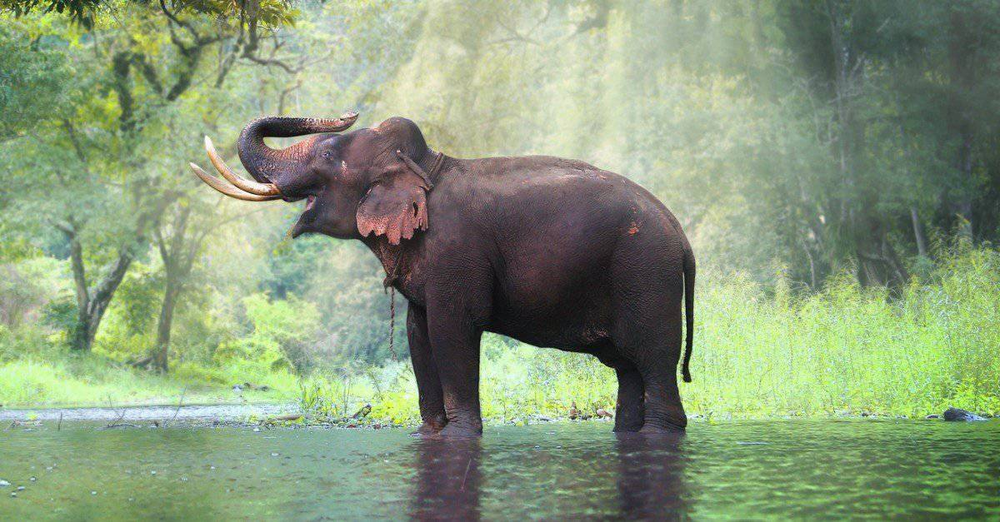

**Sentiment Analysis**

Technical Observation:

The sentiment analysis pipeline utilized a pretrained transformer model to classify the input text as positive or negative. It produced a confidence score indicating the model's certainty, demonstrating how transfer learning enables accurate sentiment prediction without additional model training.

**Text Generation**

Technical Observation:

The text generation model generated coherent and contextually relevant text based on the input prompt. The quality of the generated output depends on the prompt and decoding parameters such as maximum length and sampling strategy.

**Summarization**

Technical Observation:

The summarization model condensed the input passage into a shorter version while preserving the main ideas. This demonstrates the effectiveness of pretrained sequence-to-sequence transformer models in extracting essential information from long text with minimal loss of meaning.

**Translation**

Technical Observation:

The translation model accurately converted the English sentence into French using a pretrained sequence-to-sequence architecture. This illustrates the capability of transformer-based neural machine translation models to perform multilingual language conversion without manually designed translation rules.

**Question Answering**

Technical Observation:

The question answering model identified and extracted the most relevant answer span from the provided context instead of generating new text. This demonstrates the effectiveness of transformer models in machine reading comprehension and information extraction tasks.

**Image Classification**

Technical Observation:

The image classification model analyzed the visual features of the uploaded elephant image and predicted the most probable class (Tusker) along with confidence scores. This demonstrates how pretrained Vision Transformer (ViT) models can accurately recognize objects without requiring task-specific training.

# **---TASK 4 COMPLETED---**

# **Task 3: Analysis of Hugging Face Text-to-Image Models**

# **Model 1: Stable Diffusion XL (SDXL)**

Model Name: Stable Diffusion XL Base 1.0

Repository:
https://huggingface.co/stabilityai/stable-diffusion-xl-base-1.0

Description

Stable Diffusion XL (SDXL) is a state-of-the-art latent diffusion model developed by Stability AI for high-quality text-to-image generation. Compared to earlier Stable Diffusion versions, SDXL produces higher-resolution images with improved realism, composition, and text prompt understanding.

Limitations
May generate biased or stereotypical content.
Difficult to generate accurate text inside images.
High GPU memory requirement.
Complex prompts may still be interpreted imperfectly.
Repository Files
README.md
model_index.json
scheduler/
text_encoder/
text_encoder_2/
tokenizer/
tokenizer_2/
unet/
vae/

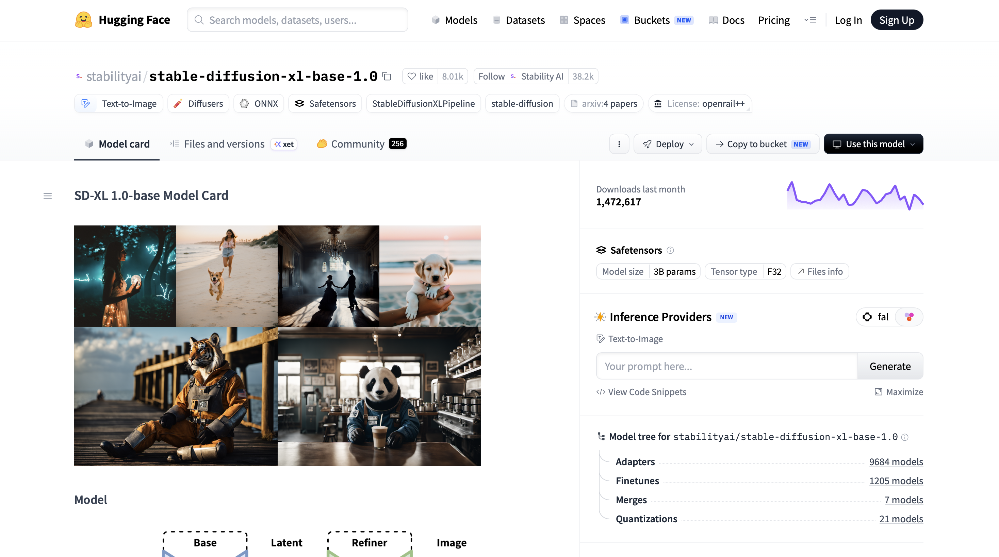

# **Model 2: FLUX.1-dev**

Model Name: FLUX.1-dev

Repository:
https://huggingface.co/black-forest-labs/FLUX.1-dev

Description

FLUX.1-dev is an advanced text-to-image diffusion model developed by Black Forest Labs. It is designed to produce highly realistic images with strong prompt adherence, detailed lighting, and excellent rendering quality.

Limitations
Large model requiring significant GPU resources.
Slower inference than lightweight models.
Subject to responsible-use licensing.
Repository Files
README.md
model_index.json
transformer/
scheduler/
tokenizer/
text_encoder/
vae/

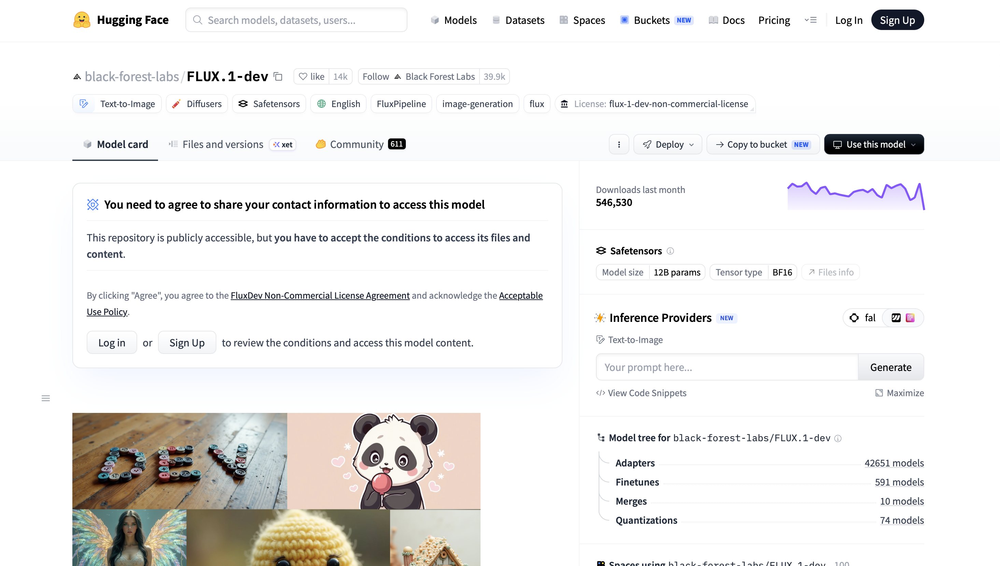


# **Model 3: Kandinsky 2.2**

Model Name: Kandinsky 2.2

Repository:
https://huggingface.co/kandinsky-community/kandinsky-2-2-decoder

Description

Kandinsky 2.2 is an open-source text-to-image generation model capable of creating high-quality artistic and photorealistic images. It combines powerful text understanding with diffusion-based image synthesis.

Limitations
Sometimes struggles with complex object relationships.
Text rendering remains imperfect.
Requires substantial computational resources.
Repository Files
README.md
model_index.json
scheduler/
tokenizer/
text_encoder/
unet/
vae/

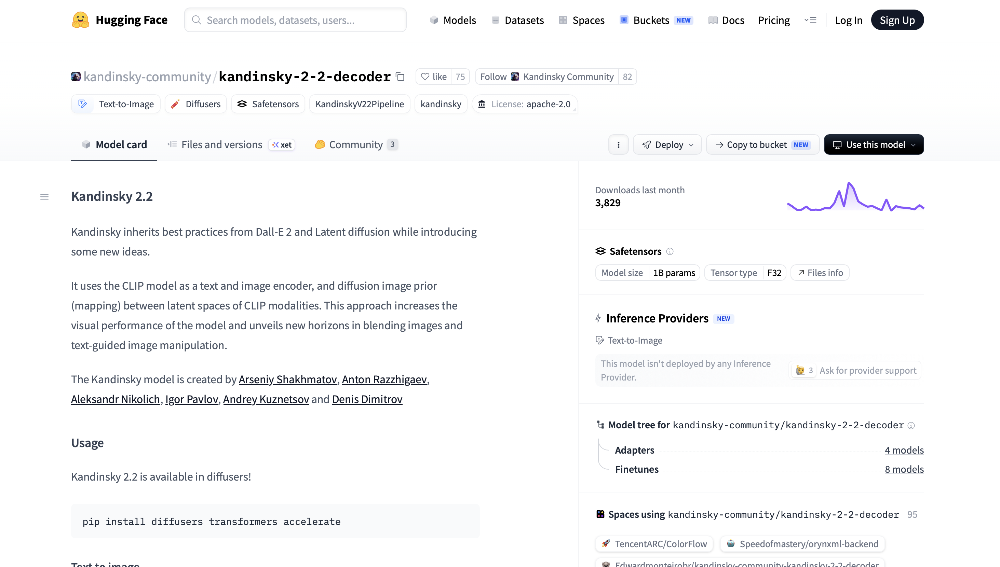

## **Comparative Summary**

| Model               | Strengths                                                        | Limitations                                           |
| ------------------- | ---------------------------------------------------------------- | ----------------------------------------------------- |
| Stable Diffusion XL | High-quality, photorealistic images, strong prompt understanding | High memory usage, imperfect text rendering           |
| FLUX.1-dev          | Excellent prompt alignment and realism                           | Computationally expensive, slower inference           |
| Kandinsky 2.2       | Good artistic and realistic image generation                     | Complex scenes and text rendering can be inconsistent |


# **---TASK 3 COMPLETED---**

# **# Task 5: Exploration of Hugging Face Spaces**

## Selected Hugging Face Space

**Space:** Stable Diffusion XL Demo

**Developer:** Stability AI

**Model type:** Diffusion-based text-to-image generative model

**License:** CreativeML Open RAIL++-M License
Model Description: This is a model that can be used to generate and modify images based on text prompts. It is a Latent Diffusion Model that uses two fixed, pretrained text encoders (OpenCLIP-ViT/G and CLIP-ViT/L).

**Resources for more information:** Check out our GitHub Repository and the SDXL report on arXiv.

### SDK

The selected Space is developed using **Gradio**, which provides an interactive
web interface for deploying machine learning models without requiring users
to write code.

### Functionality

The Stable Diffusion XL Space allows users to generate high-quality images
from natural language text prompts. Users simply enter a descriptive prompt,
and the diffusion model synthesizes a realistic image based on the input.

### Prompt

A futuristic sustainable smart city at Sunrise

### Observation

The application generated a realistic image within a few seconds.
The Gradio interface was intuitive and required no programming.
Prompt engineering significantly affected image quality and scene details.

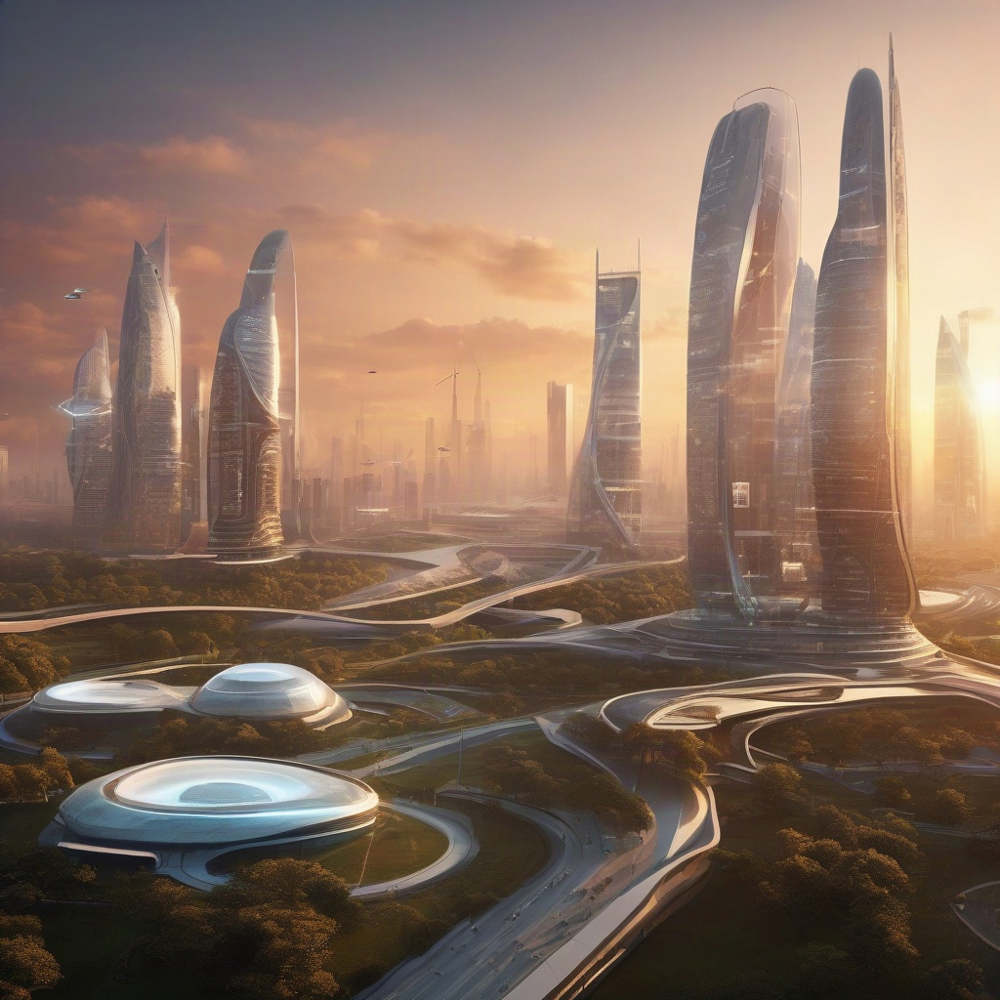

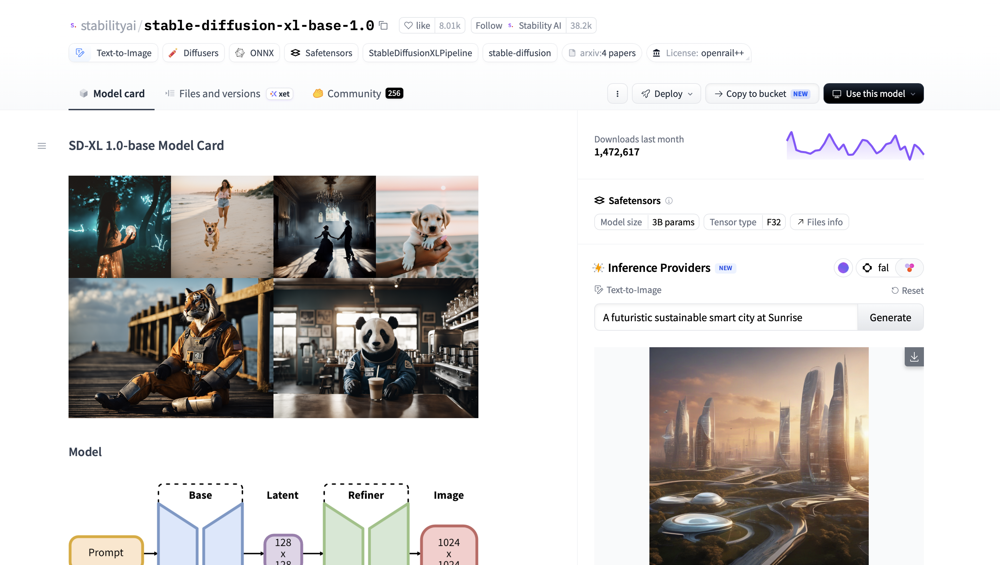

# **---TASK 5 COMPLETED---**

## Reflection
- What did you learn about the Hugging Face ecosystem?
- Which model or Space interested you the most?
- What are the advantages of pretrained models?
- How does Hugging Face support reproducible AI research?
- Compare Models, Datasets and Spaces in hugging face ecosystem

# Reflection

#### 1. What did you learn about the Hugging Face ecosystem?

The Hugging Face ecosystem provides an integrated platform for discovering, using, sharing, and deploying ML models and datasets. Through this laboratory, I learned how the Model Hub offers thousands of pretrained models, and I also learned how Hugging Face pipelines simplify inference by allowing complex AI tasks to be performed using only a few lines of code.


#### 2. Which model or Space interested you the most?

The Stable Diffusion XL (SDXL) model and its Hugging Face Space were the most interesting. It demonstrated how natural language prompts can be transformed into high-quality images. I observed that prompt engineering plays a significant role in improving image realism and semantic alignment.

#### 3. What are the advantages of pretrained models?

Pretrained models offer several advantages:

- Eliminate the need to train models from scratch.
- Save computational time and resources.
- Achieve high performance using knowledge learned from large datasets.
- Can be fine-tuned for domain-specific applications.
- Enable rapid prototyping and deployment of AI solutions.



#### 4. How does Hugging Face support reproducible AI research?

Hugging Face promotes reproducible AI research by openly sharing pretrained models, datasets, model cards, documentation, and source code. Model Cards describe model architecture, intended use, limitations, and evaluation results, while version-controlled repositories ensure that researchers can reproduce experiments using the same model versions and datasets. This transparency facilitates collaboration and reliable scientific research.



#### 5. Compare Models, Datasets and Spaces in the Hugging Face ecosystem

| Component | Purpose | Example | User Interaction |
|------------|---------|---------|------------------|
| **Models** | Store pretrained machine learning models for various AI tasks. | Stable Diffusion XL, BERT, GPT-2 | Used through APIs or Transformers pipelines. |
| **Datasets** | Provide benchmark datasets for training, fine-tuning, and evaluation. | IMDb Reviews, SQuAD, Common Voice | Downloaded and used for model development. |
| **Spaces** | Host interactive AI applications built with Gradio, Streamlit, or Docker. | Stable Diffusion Demo, Chatbot Demo | Users interact directly through a web interface without writing code. |

---

## Conclusion

This laboratory provided practical experience with the Hugging Face ecosystem by exploring pretrained models, datasets, interactive Spaces, and AI pipelines. It demonstrated how pretrained foundation models can be efficiently applied to diverse tasks such as image generation, sentiment analysis, summarization, translation, question answering, and image classification.

© AdityaArya_23cs3068